In [1]:

# from google.colab import drive
# drive.mount('/content/gdrive')

import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Pytorch dataset

In [2]:
import os
import os.path
import numpy as np
from PIL import Image
from torchvision import transforms
import torch
from typing import List, Union, Tuple, Any
from striprtf.striprtf import rtf_to_text
import albumentations

# Ci serve un codice che durante il training, una volta selezionato un video
# da cui caricare i frame, non va a prenderli tutti (potrebbero essere migliaia)
# ed il batch si riempirebbe di informazioni polarizzate ad uno stesso video

# Per ora mettiamoci nell'ipotesi semplice di caricare un solo frame nel video,
# ma credo che se si vuole usare una RNN non è questo il caso

# Se selezioniamo sempre il frame centrale, ad esempio, perdiamo la diversità (?) 38:33
# In fase di training conviene perché io voglio fornire alla mia rete campioni
# differenti. Facendo molte epoche di training, andrò a coprire quasi tutti i frame
# di un certo video ed è una strategia che può funzionare in training
# In validation, devo capire se l'addestramento deve o non deve ancora andare
# avanti, quindi scegliere elementi casuali e quindi avere un validation set che
# cambia ad ogni epoca andrebbe a sballare la loss rendendola poco confrontabile
# In validation (e quindi anche in test) per confrontare modelli diversi può avere
# senso fissarlo in maniera tale da averlo identico ad ogni epoca per avere un
# confronto basato sempre sugli stessi video

# Passo in avanti, vogliamo effettuare la classificazione sulla base di 3 frame
# consecutivi (o consecutivi e intervallati) per catturare la dinamicità (es.
# vedere qualcosa di rosso in movimento)
# Si noti che un po di augmentation la facciamo sempre, almeno un flip orizzontale
# che non ci introduce nessun problema, per cui se la facciamo randomicamente la devo
# fare su tutti i 3 frame selezionati altrimenti potrebbe condurci a risultati errati
# Le augmentation, quindi, si applicano all'insieme dei frame selezionati per un dato video
# Alcune augmentation però hanno ancora senso nel singolo, ad esempio l'introduzione
# di un po di rumore applicato (simula un rumore di acquisizione che è
# potenzialmente diverso ad ogni frame) a tale scopo si introduce ALMBUMENTATIONS
# un pacchetto di augmentation avanzata che consente di fare quello che si fa
# con torchvision ma anche di più.
# In particolare prende in input qualcosa di più strutturato che un semplice
# campione, ma magari un set di frame come serve a noi. Ma gestisce anche cose
# più complesse come la gestioen dei bounding box nell'object detection etc...


# NOTA: nei video il fuoco, se c'è, permane fino alla fine

class VideoRecord(object):
 # Sostanzilamente mantiene in memoria tutte le informazioni di annotazione di
 # un particolare video
    """
    Helper class for class VideoFrameDataset. This class
    represents a video sample's metadata.

    Args:
        root_datapath: the system path to the root folder of the videos.
        row: A list with four or more elements where
             1) The first element is the path to the video sample's frames excluding
             the root_datapath prefix
             2) The  second element is the starting frame id of the video
             3) The third element is the inclusive ending frame id of the video
             4) The fourth element is the label index.
             5) any following elements are labels in the case of multi-label classification
    """
    def __init__(self, row, root_datapath):
        # row = lista di interi che contiene:
        # 0: path del video
        # 1: primo frame del video (e qui dobbiamo decidere da dove partire)
        # 2: ultimo frame
        # 3: label della classe
        # 4: possono esserci altre annotazioni (es. fumo, fuoco)
        self._data = row
        self._path = os.path.join(root_datapath, row[0])

    @property
    def path(self) -> str:
        return self._path

    @property
    def num_frames(self) -> int:
        return self.end_frame - self.start_frame + 1  # +1 because end frame is inclusive

    @property
    def start_frame(self) -> int:
        return int(self._data[1])

    @property
    def end_frame(self) -> int:
        return int(self._data[2])

    @property
    def label(self) -> Union[int, List[int]]:
        # just one label_id
        if len(self._data) == 4:
            return int(self._data[3])
        # sample associated with multiple labels
        else:
            return [int(label_id) for label_id in self._data[3:]]


class VideoFrameDataset(torch.utils.data.Dataset):
    r"""
    A highly efficient and adaptable dataset class for videos.
    Instead of loading every frame of a video,
    loads x RGB frames of a video (sparse temporal sampling) and evenly
    chooses those frames from start to end of the video, returning
    a list of x PIL images or ``FRAMES x CHANNELS x HEIGHT x WIDTH``
    tensors.

    More specifically, the frame range [START_FRAME, END_FRAME] is divided into NUM_SEGMENTS
    segments and FRAMES_PER_SEGMENT consecutive frames are taken from each segment.

    Note:
        A demonstration of using this class can be seen
        in ``demo.py``
        https://github.com/RaivoKoot/Video-Dataset-Loading-Pytorch

    Note:
        This dataset broadly corresponds to the frame sampling technique
        introduced in ``Temporal Segment Networks`` at ECCV2016
        https://arxiv.org/abs/1608.00859.

    Args:
        root_path: The root path in which video folders lie.
                   this is ROOT_DATA from the description above.
        num_segments: The number of segments the video should
                      be divided into to sample frames from.
        frames_per_segment: The number of frames that should
                            be loaded per segment. For each segment's
                            frame-range, a random start index or the
                            center is chosen, from which frames_per_segment
                            consecutive frames are loaded.
        imagefile_template: The image filename template that video frame files
                            have inside of their video folders as described above.
        transform: Transform pipeline that receives a list of numpy images/frames.
        test_mode: If True, frames are taken from the center of each
                   segment, instead of a random location in each segment.

    """
    def __init__(self,
                 root_path: str, # dove sono contenuti i frame estratti         #? Questo non introdurrebbe dipendenza tra i dati???
                 num_segments: int = 1, # divide il video da cui caricare i
                 # frame in un certo numero di sezioni della stessa durata.
                 frames_per_segment: int = 3, # frame estratti dal segmento in maniera (di default) a caso
                 imagefile_template: str='{:05d}.jpg', # pattern nome dei frame
                 transform=None, # pipeline di augmentation preprocessing
                 totensor=True, # lasciarlo sempre a True
                 test_mode: bool = False): # quanto True, i frame vengono presi
                 # sempre nelle stesse posizioni. È quello che vogliamo fare
                 # quando costruiamo dataset per test o validation
        super(VideoFrameDataset, self).__init__()

        self.root_path = root_path
        self.num_segments = num_segments
        self.frames_per_segment = frames_per_segment
        self.imagefile_template = imagefile_template
        self.test_mode = test_mode

        if transform is None:
            self.transform = None
        else:
            additional_targets = {}
            for i in range(self.num_segments * self.frames_per_segment - 1):
                additional_targets["image%d" % i] = "image"
            self.transform = albumentations.Compose([transform],
                                                    additional_targets=additional_targets,
                                                    p=1)
        self.totensor = totensor
        self.totensor_transform = ImglistOrdictToTensor()

        self._parse_annotationfile()
        self._sanity_check_samples()

    def _load_image(self, directory: str, idx: int) -> Image.Image:
        return np.asarray(Image.open(os.path.join(directory, self.imagefile_template.format(idx))).convert('RGB'))

    def _parse_annotationfile(self):
      # Usando l'organizzazione delle cartelle suggerita l'annotazione viene
      # gestita in automatico. Per ogni file video il codice ricava la posizione
      # del rispettivo file rtf e fa il parsing del file per ricavare la GT
      # In particolare quando vede un video di classe 1, segna il primo frame di
      # avvistamento del fuoco e da lì in poi selezionarà i frame randomici,
      # andando ad ignorare un'eventuale fase del video iniziale in cui il fuoco
      # non c'è
      # Fatto questo parse abbiamo costruito la label del video
        self.video_list = []
        for class_name in os.listdir(self.root_path):
            for video_name in os.listdir(os.path.join(self.root_path, class_name)):
                frames_dir = os.path.join(self.root_path, class_name, video_name)
                if os.path.isdir(frames_dir):
                    frame_path = os.path.join(class_name, video_name)
                    end_frame = len(os.listdir(frames_dir))

                    annotation_path = frames_dir\
                        .replace("\\", "/") \
                        .replace("FRAMES/", "GT/") \
                        .replace(".mp4", ".rtf")

                    with open(annotation_path, 'r') as file:
                        text = rtf_to_text(file.read())
                    if len(text):
                        label = 1
                        start_frame = int(text.split(",")[0])
                        if start_frame == 0:
                          start_frame = 1
                    else:
                        label = 0
                        start_frame = 1

                    self.video_list.append(VideoRecord(
                        [frame_path, start_frame, end_frame, label],
                        self.root_path))

    def _sanity_check_samples(self):
      # Controllo delle annotazioni ricavate per ogni video
        for record in self.video_list:
            if record.num_frames <= 0 or record.start_frame == record.end_frame:
                print(f"\nDataset Warning: video {record.path} seems to have zero RGB frames on disk!\n")

            elif record.num_frames < (self.num_segments * self.frames_per_segment):
                print(f"\nDataset Warning: video {record.path} has {record.num_frames} frames "
                      f"but the dataloader is set up to load "
                      f"(num_segments={self.num_segments})*(frames_per_segment={self.frames_per_segment})"
                      f"={self.num_segments * self.frames_per_segment} frames. Dataloader will throw an "
                      f"error when trying to load this video.\n")

    def _get_start_indices(self, record: VideoRecord) -> 'np.ndarray[int]':
        """
        For each segment, choose a start index from where frames
        are to be loaded from.

        Args:
            record: VideoRecord denoting a video sample.
        Returns:
            List of indices of where the frames of each
            segment are to be loaded from.
        """
        # choose start indices that are perfectly evenly spread across the video frames.
        if self.test_mode:
            distance_between_indices = (record.num_frames - self.frames_per_segment + 1) / float(self.num_segments)

            start_indices = np.array([int(distance_between_indices / 2.0 + distance_between_indices * x)
                                      for x in range(self.num_segments)])
        # randomly sample start indices that are approximately evenly spread across the video frames.
        else:
            max_valid_start_index = (record.num_frames - self.frames_per_segment + 1) // self.num_segments

            start_indices = np.multiply(list(range(self.num_segments)), max_valid_start_index) + \
                      np.random.randint(max_valid_start_index, size=self.num_segments)

        return start_indices

    def __getitem__(self, idx: int) -> Union[
        Tuple[List[Image.Image], Union[int, List[int]]],
        Tuple['torch.Tensor[num_frames, channels, height, width]', Union[int, List[int]]],
        Tuple[Any, Union[int, List[int]]],
        ]:
        """
        For video with id idx, loads self.NUM_SEGMENTS * self.FRAMES_PER_SEGMENT
        frames from evenly chosen locations across the video.

        Args:
            idx: Video sample index.
        Returns:
            A tuple of (video, label). Label is either a single
            integer or a list of integers in the case of multiple labels.
            Video is either 1) a list of PIL images if no transform is used
            2) a batch of shape (NUM_IMAGES x CHANNELS x HEIGHT x WIDTH) in the range [0,1]
            if the transform "ImglistToTensor" is used
            3) or anything else if a custom transform is used.
        """
        record: VideoRecord = self.video_list[idx]

        frame_start_indices: 'np.ndarray[int]' = self._get_start_indices(record)

        return self._get(record, frame_start_indices)

    def _get(self, record: VideoRecord, frame_start_indices: 'np.ndarray[int]') -> Union[
        Tuple[List[Image.Image], Union[int, List[int]]],
        Tuple['torch.Tensor[num_frames, channels, height, width]', Union[int, List[int]]],
        Tuple[Any, Union[int, List[int]]],
        ]:
        """
        Loads the frames of a video at the corresponding
        indices.

        Args:
            record: VideoRecord denoting a video sample.
            frame_start_indices: Indices from which to load consecutive frames from.
        Returns:
            A tuple of (video, label). Label is either a single
            integer or a list of integers in the case of multiple labels.
            Video is either 1) a list of PIL images if no transform is used
            2) a batch of shape (NUM_IMAGES x CHANNELS x HEIGHT x WIDTH) in the range [0,1]
            if the transform "ImglistToTensor" is used
            3) or anything else if a custom transform is used.
        """

        frame_start_indices = frame_start_indices + record.start_frame
        images = list()

        # from each start_index, load self.frames_per_segment
        # consecutive frames
        for start_index in frame_start_indices:
            frame_index = int(start_index)

            # load self.frames_per_segment consecutive frames
            for _ in range(self.frames_per_segment):
                image = self._load_image(record.path, frame_index)
                images.append(image)

                if frame_index < record.end_frame:
                    frame_index += 1

        if self.transform is not None:
            transform_input = {"image": images[0]}
            for i, image in enumerate(images[1:]):
                transform_input["image%d" % i] = image
            images = self.transform(**transform_input)

        if self.totensor:
            images = self.totensor_transform(images)
        return images, record.label

    def __len__(self):
        return len(self.video_list)


class ImglistOrdictToTensor(torch.nn.Module):
    """
    Converts a list or a dict of numpy images to a torch.FloatTensor
    of shape (NUM_IMAGES x CHANNELS x HEIGHT x WIDTH).
    Can be used as first transform for ``VideoFrameDataset``.
    """
    @staticmethod
    def forward(img_list_or_dict):
        """
        Converts each numpy image in a list or a dict to
        a torch Tensor and stacks them into a single tensor.

        Args:
            img_list_or_dict: list or dict of numpy images.
        Returns:
            tensor of size ``NUM_IMAGES x CHANNELS x HEIGHT x WIDTH``
        """
        if isinstance(img_list_or_dict, list):
            return torch.stack([transforms.functional.to_tensor(img)
                                for img in img_list_or_dict])
        else:
            return torch.stack([transforms.functional.to_tensor(img_list_or_dict[k])
                                for k in img_list_or_dict.keys()])


# Model

In [3]:
import torchvision.models as models
model = models.resnet18(pretrained=True)
model

/Users/graziaferrara/opt/anaconda3/envs/ml_env/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/graziaferrara/opt/anaconda3/envs/ml_env/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [4]:
import torch
import torch.nn as nn
import torchvision.models as models

class FireDetectionModel(nn.Module):
    def __init__(self):
        super(FireDetectionModel, self).__init__()

       # combine a pre-trained CNN, a RNN, and a FC layer
        model = models.resnet18(pretrained=True)
        
        for param in model.parameters():
            param.requires_grad = False
            
        for param in model.layer4.parameters():
            param.requires_grad = True
            
        self.cnn = nn.Sequential(*list(model.children())[:-1])
            
        self.rnn = nn.LSTM(input_size=512, hidden_size=512, num_layers=1, batch_first=True)
        
        self.fc = nn.Linear(512, 1)
        
    def forward(self, x):
        
        # CNN
        c_out = self.cnn(x)
        # remove the last two dims which are 1
        c_out = c_out.squeeze(3).squeeze(2)
        
        # RNN
        r_out, _ = self.rnn(c_out)
        
        # FC
        out = self.fc(r_out)
        return out
    
    def get_non_pretrained_parameters(self):
        return filter(lambda p: p.requires_grad, self.parameters())
    
model = FireDetectionModel()


In [5]:
model

FireDetectionModel(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stat

# Pre-processing

In [6]:
import cv2

# Preprocessing and augmentation
# applica sempre, ha senso per il preprocessing
preprocessing = albumentations.Sequential([
    albumentations.Resize(height=256, width=256, always_apply=True),
    albumentations.CenterCrop(height=224, width=224, always_apply=True),
    albumentations.Normalize(mean=[0.485, 0.456, 0.406],
                                std=[0.229, 0.224, 0.225],
                                max_pixel_value=255.,
                                always_apply=True),
])

augmentation = albumentations.OneOf([
    albumentations.HorizontalFlip(p=0.2),
    albumentations.Rotate(p=1., limit=30),
    albumentations.GaussNoise(p=0.2),
    ], p=.5)

# Dataset for training
train_dataset = VideoFrameDataset(root_path="FRAMES/TRAINING_SET/",
                            num_segments=1,
                            frames_per_segment=1,
                            transform=albumentations.Compose([
                                preprocessing,
                                augmentation],
                                p=1.,
                            )
                            )

val_dataset = VideoFrameDataset(root_path="FRAMES/VALIDATION_SET/",
                            num_segments=1,
                            frames_per_segment=1,
                            transform=albumentations.Compose([
                                preprocessing,
                                augmentation],
                                p=1.,
                            ),
                            test_mode=True
                            )

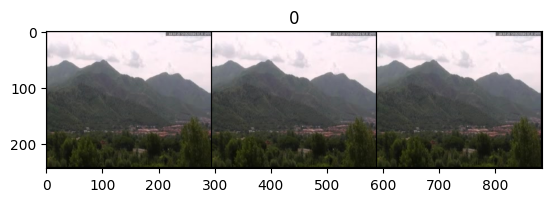

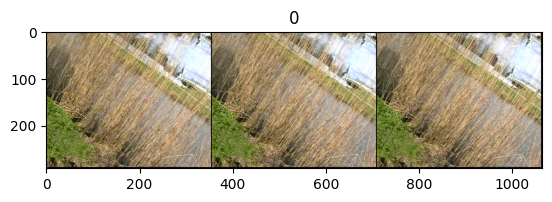

/Users/graziaferrara/opt/anaconda3/envs/ml_env/lib/python3.10/site-packages/torchvision/transforms/functional.py:152: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_numpy.cpp:212.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()


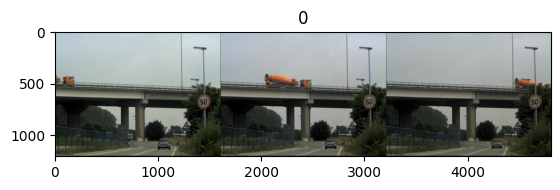

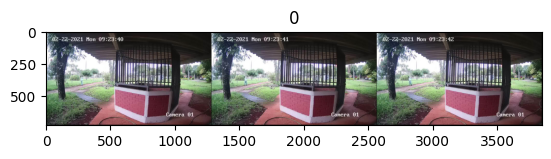

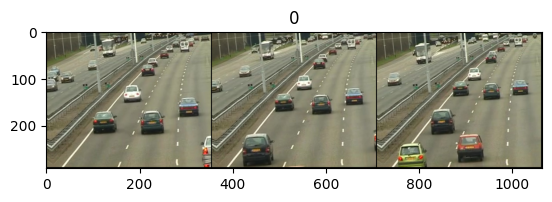

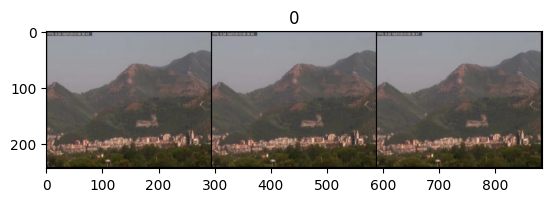

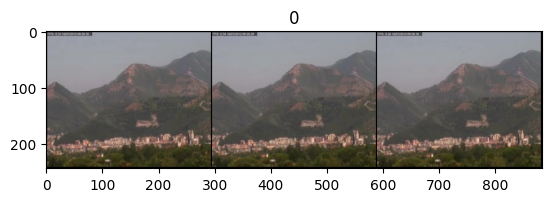

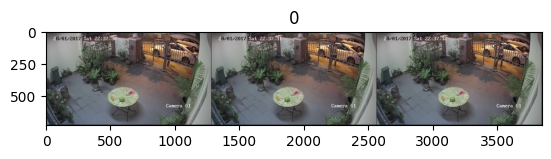

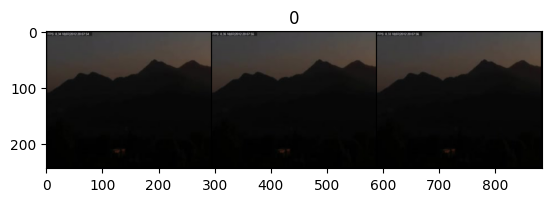

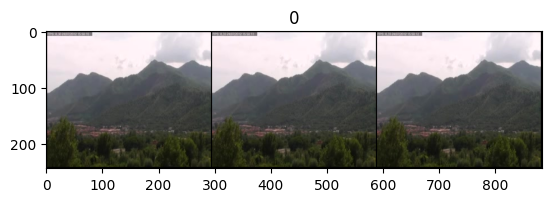

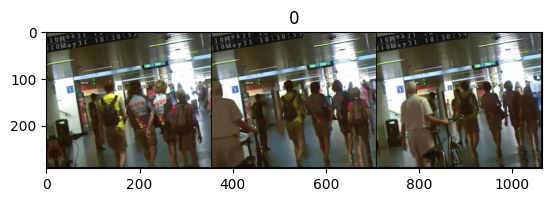

In [7]:
def demo_visualization():
    from torchvision.utils import make_grid
    import matplotlib.pyplot as plt

    # Augmentation
    # OneOf prende in ingresso una lista di augmentation ed applica con una
    # certa probabilità solo una augmentation di questa lista (presa casualmente)
    augmentation = albumentations.OneOf([
        albumentations.HorizontalFlip(p=0.2),
        albumentations.Rotate(p=1., limit=30),
        albumentations.GaussNoise(p=0.2),
        ], p=.5)

    # Dataset with augmentation for visualization
    dataset = VideoFrameDataset(root_path="FRAMES/TRAINING_SET/",
                                num_segments=1,
                                frames_per_segment=3,
                                transform=augmentation,
                                )
    counter = 0
    for X, y in dataset:
        if counter > 10:
            break
        plt.figure()
        plt.imshow(make_grid(X).numpy().transpose((1, 2, 0)))
        plt.title(y)
        plt.show()
        counter += 1



demo_visualization()

# Questa demo è utile per testare l'augumentation prima di far iniziare il
# training per un certo numero di ore

# Training

In [8]:
from torch.utils.tensorboard import SummaryWriter
from tensorboard import notebook

def start_tensorboard(log_dir):
  writer = SummaryWriter(os.path.join("runs", log_dir))

  # run tensorboard in background
  ! killall tensorboard
  %load_ext tensorboard
  %tensorboard --logdir ./runs

  notebook.list() # View open TensorBoard instances

  return writer

In [9]:
from torchvision.utils import make_grid
from tqdm import tqdm

def one_epoch(model, lossFunction, output_activation, optimizer, train_loader, val_loader, writer, epoch_num):
  model = model.to(device)

  model.train()

  i_start = epoch_num * len(train_loader)
  for i, (X, y) in tqdm(enumerate(train_loader), desc="epoch {} - train".format(epoch_num)):

    # remove the second dimension (num_segments)
    #X = X.squeeze(1)

    # Merge the first dimension (batch_size) and the second dimension (num_segments)
    X = X.reshape(-1, *X.shape[2:])

    X = X.to(device)
    y = y.to(device).float()

    optimizer.zero_grad()

    o = model(X)
    o = output_activation(o)

    # make shape of o and y the same
    if o.shape != y.shape:
      y = y.reshape(o.shape)

    l = lossFunction(o, y)

    l.backward()
    optimizer.step()

    acc = ((o.detach() > .5) == y.detach()).float().mean()

    # print("- batch loss and accuracy : {:.7f}\t{:.4f}".format(l.detach().item(), acc))
    writer.add_scalar('train/loss', l.detach().item(), i_start+i)
    writer.add_scalar('train/acc', acc, i_start+i)

  model.eval()
  with torch.no_grad():
    val_loss = []
    val_corr_pred = []
    for X, y in tqdm(val_loader, desc="epoch {} - validation".format(epoch_num)):
      # Merge the first dimension (batch_size) and the second dimension (num_segments)
      X = X.reshape(-1, *X.shape[2:])

      X = X.to(device)
      y = y.to(device).float()

      o = model(X)
      o = output_activation(o).squeeze()
      val_loss.append(lossFunction(o, y))
      val_corr_pred.append((o > .5) == y)

    val_loss = torch.stack(val_loss).mean().item()
    val_accuracy = torch.concatenate(val_corr_pred).float().mean().item()

    # print("Validation loss and accuracy : {:.7f}\t{:.4f}".format(val_loss, val_accuracy))
    writer.add_scalar('val/loss', val_loss, i_start+i)
    writer.add_scalar('val/acc', val_accuracy, i_start+i)
  return val_loss, val_accuracy

In [10]:
from torch.nn import BCELoss, CrossEntropyLoss, Sigmoid, Softmax

# learning parameters
lossFunction, output_activation = BCELoss(), Sigmoid()
batch_size = 2
lr = .001
momentum = .9
lambda_reg = 0

epochs = 200
early_stopping_patience = 5

optimizer = torch.optim.Adam(model.get_non_pretrained_parameters(),
                          lr=lr,
                          weight_decay=lambda_reg)

# create output directory and logger
experiment_name = "combo"

In [ ]:
import os
!rm -r combo
os.makedirs(experiment_name)
writer = start_tensorboard(experiment_name)
!reload_ext tensorboard

No matching processes belonging to you were found


ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
TensorFlow installation not found - running with reduced feature set.

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Can't assign requested address

No known TensorBoard instances running.
zsh:1: command not found: reload_ext


In [13]:
from torch.utils.data import DataLoader
dataloader_params = {"batch_size": batch_size, "num_workers": 0, "pin_memory": True}
train_loader = DataLoader(train_dataset, shuffle=True, **dataloader_params)
val_loader = DataLoader(val_dataset, shuffle=False, **dataloader_params)

# early stopping and best model saving
early_stopping_counter = early_stopping_patience
min_val_loss = 1e10

# training and validation
val_losses = torch.zeros(epochs)
val_accuracies = torch.zeros(epochs)
for e in range(epochs):
  print("EPOCH {}".format(e))
  val_loss, val_accuracy = one_epoch(model, lossFunction, output_activation, optimizer, train_loader, val_loader, writer, e)

  # store the validation metrics
  val_losses[e] = val_loss
  val_accuracies[e] = val_accuracy
  torch.save(val_losses, os.path.join(experiment_name,'val_losses.pth'))
  torch.save(val_accuracies, os.path.join(experiment_name,'val_accuracies.pth'))

  # save the best model and check the early stopping criteria
  if val_loss < min_val_loss: # save the best model
    min_val_loss = val_loss
    early_stopping_counter = early_stopping_patience # reset early stopping counter
    torch.save(model.state_dict(), os.path.join(experiment_name,'best_model.pth'))
    print("- saved best model: val_loss =", val_loss, "val_accuracy =", val_accuracy)

  if e>0: # early stopping counter update
    if val_losses[e] > val_losses[e-1]:
        early_stopping_counter -= 1 # update early stopping counter
    else:
        early_stopping_counter = early_stopping_patience # reset early stopping counter
  if early_stopping_counter == 0: # early stopping
      break

EPOCH 0


epoch 0 - train: 125it [00:46,  2.67it/s]
epoch 0 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.96it/s]


- saved best model: val_loss = 0.6269317865371704 val_accuracy = 0.699999988079071
EPOCH 1


epoch 1 - train: 125it [00:45,  2.73it/s]
epoch 1 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.85it/s]


- saved best model: val_loss = 0.598767876625061 val_accuracy = 0.699999988079071
EPOCH 2


epoch 2 - train: 125it [00:33,  3.70it/s]
epoch 2 - validation: 100%|██████████| 15/15 [00:02<00:00,  7.14it/s]


EPOCH 3


epoch 3 - train: 125it [00:44,  2.80it/s]
epoch 3 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.56it/s]


- saved best model: val_loss = 0.5886369347572327 val_accuracy = 0.699999988079071
EPOCH 4


epoch 4 - train: 125it [00:37,  3.36it/s]
epoch 4 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.57it/s]


EPOCH 5


epoch 5 - train: 125it [00:43,  2.87it/s]
epoch 5 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.49it/s]


EPOCH 6


epoch 6 - train: 125it [00:42,  2.94it/s]
epoch 6 - validation: 100%|██████████| 15/15 [00:02<00:00,  5.73it/s]


EPOCH 7


epoch 7 - train: 125it [00:56,  2.20it/s]
epoch 7 - validation: 100%|██████████| 15/15 [00:02<00:00,  7.31it/s]


- saved best model: val_loss = 0.5603404641151428 val_accuracy = 0.699999988079071
EPOCH 8


epoch 8 - train: 125it [00:44,  2.83it/s]
epoch 8 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.68it/s]


EPOCH 9


epoch 9 - train: 125it [00:47,  2.66it/s]
epoch 9 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.39it/s]


EPOCH 10


epoch 10 - train: 125it [00:40,  3.05it/s]
epoch 10 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.52it/s]


EPOCH 11


epoch 11 - train: 125it [00:40,  3.11it/s]
epoch 11 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.51it/s]


EPOCH 12


epoch 12 - train: 125it [00:39,  3.20it/s]
epoch 12 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.50it/s]


- saved best model: val_loss = 0.5360593199729919 val_accuracy = 0.699999988079071
EPOCH 13


epoch 13 - train: 125it [00:46,  2.69it/s]
epoch 13 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.51it/s]


EPOCH 14


epoch 14 - train: 125it [00:27,  4.52it/s]
epoch 14 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.36it/s]


EPOCH 15


epoch 15 - train: 125it [00:28,  4.43it/s]
epoch 15 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.05it/s]


EPOCH 16


epoch 16 - train: 125it [00:35,  3.56it/s]
epoch 16 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.33it/s]


EPOCH 17


epoch 17 - train: 125it [00:34,  3.63it/s]
epoch 17 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.05it/s]


EPOCH 18


epoch 18 - train: 125it [00:27,  4.57it/s]
epoch 18 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.13it/s]


EPOCH 19


epoch 19 - train: 125it [00:31,  3.98it/s]
epoch 19 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]


EPOCH 20


epoch 20 - train: 125it [00:43,  2.89it/s]
epoch 20 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.25it/s]


- saved best model: val_loss = 0.49868589639663696 val_accuracy = 0.699999988079071
EPOCH 21


epoch 21 - train: 125it [00:37,  3.36it/s]
epoch 21 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.36it/s]


EPOCH 22


epoch 22 - train: 125it [00:36,  3.39it/s]
epoch 22 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.12it/s]


EPOCH 23


epoch 23 - train: 125it [00:30,  4.08it/s]
epoch 23 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.93it/s]


EPOCH 24


epoch 24 - train: 125it [00:35,  3.52it/s]
epoch 24 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.59it/s]


EPOCH 25


epoch 25 - train: 125it [00:31,  4.03it/s]
epoch 25 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.31it/s]


EPOCH 26


epoch 26 - train: 125it [00:30,  4.07it/s]
epoch 26 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.33it/s]


EPOCH 27


epoch 27 - train: 125it [00:36,  3.39it/s]
epoch 27 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.07it/s]


EPOCH 28


epoch 28 - train: 125it [00:27,  4.55it/s]
epoch 28 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.99it/s]


EPOCH 29


epoch 29 - train: 125it [00:34,  3.60it/s]
epoch 29 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.93it/s]


EPOCH 30


epoch 30 - train: 125it [00:28,  4.32it/s]
epoch 30 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.63it/s]


EPOCH 31


epoch 31 - train: 125it [00:42,  2.93it/s]
epoch 31 - validation: 100%|██████████| 15/15 [00:05<00:00,  2.58it/s]


EPOCH 32


epoch 32 - train: 125it [00:49,  2.53it/s]
epoch 32 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.94it/s]


EPOCH 33


epoch 33 - train: 125it [00:33,  3.72it/s]
epoch 33 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.45it/s]


EPOCH 34


epoch 34 - train: 125it [00:30,  4.07it/s]
epoch 34 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.27it/s]


- saved best model: val_loss = 0.4831276535987854 val_accuracy = 0.8333333134651184
EPOCH 35


epoch 35 - train: 125it [00:35,  3.53it/s]
epoch 35 - validation: 100%|██████████| 15/15 [00:02<00:00,  5.21it/s]


EPOCH 36


epoch 36 - train: 125it [00:44,  2.80it/s]
epoch 36 - validation: 100%|██████████| 15/15 [00:02<00:00,  7.00it/s]


EPOCH 37


epoch 37 - train: 125it [00:51,  2.45it/s]
epoch 37 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.63it/s]


EPOCH 38


epoch 38 - train: 125it [00:38,  3.25it/s]
epoch 38 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.41it/s]


EPOCH 39


epoch 39 - train: 125it [00:47,  2.64it/s]
epoch 39 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.62it/s]


EPOCH 40


epoch 40 - train: 125it [00:52,  2.38it/s]
epoch 40 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.55it/s]


EPOCH 41


epoch 41 - train: 125it [00:39,  3.13it/s]
epoch 41 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.38it/s]


- saved best model: val_loss = 0.4683440327644348 val_accuracy = 0.7666666507720947
EPOCH 42


epoch 42 - train: 125it [00:40,  3.09it/s]
epoch 42 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.79it/s]


EPOCH 43


epoch 43 - train: 125it [00:40,  3.09it/s]
epoch 43 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.21it/s]


EPOCH 44


epoch 44 - train: 125it [00:39,  3.16it/s]
epoch 44 - validation: 100%|██████████| 15/15 [00:02<00:00,  7.39it/s]


- saved best model: val_loss = 0.4300767481327057 val_accuracy = 0.800000011920929
EPOCH 45


epoch 45 - train: 125it [00:33,  3.68it/s]
epoch 45 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.16it/s]


EPOCH 46


epoch 46 - train: 125it [00:33,  3.69it/s]
epoch 46 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.01it/s]


EPOCH 47


epoch 47 - train: 125it [00:32,  3.86it/s]
epoch 47 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.58it/s]


EPOCH 48


epoch 48 - train: 125it [00:31,  3.91it/s]
epoch 48 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.26it/s]


- saved best model: val_loss = 0.3972485661506653 val_accuracy = 0.800000011920929
EPOCH 49


epoch 49 - train: 125it [00:32,  3.88it/s]
epoch 49 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.57it/s]


EPOCH 50


epoch 50 - train: 125it [00:48,  2.55it/s]
epoch 50 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.05it/s]


EPOCH 51


epoch 51 - train: 125it [00:47,  2.63it/s]
epoch 51 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.93it/s]


EPOCH 52


epoch 52 - train: 125it [00:34,  3.63it/s]
epoch 52 - validation: 100%|██████████| 15/15 [00:02<00:00,  7.02it/s]


EPOCH 53


epoch 53 - train: 125it [00:30,  4.09it/s]
epoch 53 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.01it/s]


- saved best model: val_loss = 0.35039693117141724 val_accuracy = 0.8333333134651184
EPOCH 54


epoch 54 - train: 125it [00:28,  4.39it/s]
epoch 54 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.05it/s]


EPOCH 55


epoch 55 - train: 125it [00:36,  3.43it/s]
epoch 55 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.94it/s]


- saved best model: val_loss = 0.30174535512924194 val_accuracy = 0.8666666746139526
EPOCH 56


epoch 56 - train: 125it [00:29,  4.23it/s]
epoch 56 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.63it/s]


EPOCH 57


epoch 57 - train: 125it [00:34,  3.62it/s]
epoch 57 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.00it/s]


EPOCH 58


epoch 58 - train: 125it [00:29,  4.19it/s]
epoch 58 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.31it/s]


EPOCH 59


epoch 59 - train: 125it [00:29,  4.17it/s]
epoch 59 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.87it/s]


EPOCH 60


epoch 60 - train: 125it [00:27,  4.55it/s]
epoch 60 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.95it/s]


EPOCH 61


epoch 61 - train: 125it [00:31,  3.94it/s]
epoch 61 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.09it/s]


EPOCH 62


epoch 62 - train: 125it [00:29,  4.19it/s]
epoch 62 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.40it/s]


EPOCH 63


epoch 63 - train: 125it [00:32,  3.90it/s]
epoch 63 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.69it/s]


EPOCH 64


epoch 64 - train: 125it [00:29,  4.26it/s]
epoch 64 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.50it/s]


EPOCH 65


epoch 65 - train: 125it [00:34,  3.65it/s]
epoch 65 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.74it/s]


EPOCH 66


epoch 66 - train: 125it [00:30,  4.07it/s]
epoch 66 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.23it/s]


EPOCH 67


epoch 67 - train: 125it [00:30,  4.14it/s]
epoch 67 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.28it/s]


EPOCH 68


epoch 68 - train: 125it [00:32,  3.79it/s]
epoch 68 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.71it/s]


EPOCH 69


epoch 69 - train: 125it [00:35,  3.51it/s]
epoch 69 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.42it/s]


EPOCH 70


epoch 70 - train: 125it [00:30,  4.04it/s]
epoch 70 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.04it/s]


EPOCH 71


epoch 71 - train: 125it [00:29,  4.28it/s]
epoch 71 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.88it/s]


EPOCH 72


epoch 72 - train: 125it [00:30,  4.04it/s]
epoch 72 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.52it/s]


EPOCH 73


epoch 73 - train: 125it [00:31,  3.97it/s]
epoch 73 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.19it/s]


EPOCH 74


epoch 74 - train: 125it [00:29,  4.18it/s]
epoch 74 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.62it/s]


- saved best model: val_loss = 0.2816373109817505 val_accuracy = 0.8999999761581421
EPOCH 75


epoch 75 - train: 125it [00:34,  3.64it/s]
epoch 75 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.72it/s]


EPOCH 76


epoch 76 - train: 125it [00:34,  3.57it/s]
epoch 76 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.30it/s]


EPOCH 77


epoch 77 - train: 125it [00:30,  4.08it/s]
epoch 77 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.94it/s]


EPOCH 78


epoch 78 - train: 125it [00:29,  4.31it/s]
epoch 78 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.68it/s]


- saved best model: val_loss = 0.24469782412052155 val_accuracy = 0.8999999761581421
EPOCH 79


epoch 79 - train: 125it [00:31,  3.98it/s]
epoch 79 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.66it/s]


EPOCH 80


epoch 80 - train: 125it [00:33,  3.68it/s]
epoch 80 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.31it/s]


EPOCH 81


epoch 81 - train: 125it [00:32,  3.80it/s]
epoch 81 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.35it/s]


EPOCH 82


epoch 82 - train: 125it [00:35,  3.51it/s]
epoch 82 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.16it/s]


EPOCH 83


epoch 83 - train: 125it [00:43,  2.86it/s]
epoch 83 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.64it/s]


EPOCH 84


epoch 84 - train: 125it [00:35,  3.50it/s]
epoch 84 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.61it/s]


EPOCH 85


epoch 85 - train: 125it [00:35,  3.48it/s]
epoch 85 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.16it/s]


EPOCH 86


epoch 86 - train: 125it [00:27,  4.56it/s]
epoch 86 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.76it/s]


EPOCH 87


epoch 87 - train: 125it [00:30,  4.13it/s]
epoch 87 - validation: 100%|██████████| 15/15 [00:02<00:00,  7.27it/s]


EPOCH 88


epoch 88 - train: 125it [00:26,  4.70it/s]
epoch 88 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.55it/s]


EPOCH 89


epoch 89 - train: 125it [00:29,  4.25it/s]
epoch 89 - validation: 100%|██████████| 15/15 [00:02<00:00,  5.75it/s]


EPOCH 90


epoch 90 - train: 125it [00:30,  4.15it/s]
epoch 90 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.46it/s]


- saved best model: val_loss = 0.23207801580429077 val_accuracy = 0.9333333373069763
EPOCH 91


epoch 91 - train: 125it [00:28,  4.34it/s]
epoch 91 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.87it/s]


EPOCH 92


epoch 92 - train: 125it [00:26,  4.79it/s]
epoch 92 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.21it/s]


EPOCH 93


epoch 93 - train: 125it [00:39,  3.15it/s]
epoch 93 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.65it/s]


EPOCH 94


epoch 94 - train: 125it [00:35,  3.53it/s]
epoch 94 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.35it/s]


EPOCH 95


epoch 95 - train: 125it [00:37,  3.37it/s]
epoch 95 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.58it/s]


EPOCH 96


epoch 96 - train: 125it [00:27,  4.50it/s]
epoch 96 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.29it/s]


EPOCH 97


epoch 97 - train: 125it [00:37,  3.30it/s]
epoch 97 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.56it/s]


EPOCH 98


epoch 98 - train: 125it [00:39,  3.14it/s]
epoch 98 - validation: 100%|██████████| 15/15 [00:02<00:00,  7.07it/s]


EPOCH 99


epoch 99 - train: 125it [00:27,  4.57it/s]
epoch 99 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.58it/s]


# Testing

In [11]:
from torch.utils.data import DataLoader

# Dataset with augmentation for visualization
test_dataset = VideoFrameDataset(root_path="FRAMES/TEST_SET/",
                            num_segments=1,
                            frames_per_segment=1,
                            transform=albumentations.Compose([preprocessing, augmentation], p=1.),
                            test_mode=True,
                            )

dataloader_params = {"batch_size": batch_size, "num_workers": 0, "pin_memory": True}
test_loader = DataLoader(test_dataset, shuffle=False, **dataloader_params)

model = FireDetectionModel().to(device)
model.load_state_dict(torch.load(os.path.join(experiment_name,'best_model.pth')))

Y, Y_hat = [], []
with torch.no_grad():
  model.eval()
  for X, y in test_loader:
    # Merge the first dimension (batch_size) and the second dimension (num_segments)
    X = X.reshape(-1, *X.shape[2:])
    Y.append(y)
    out = (output_activation(model(X.to(device))) > .5).squeeze().cpu()
    if len(out.shape) == 1 and out.shape[0] == 2:
      Y_hat.append(out)
    else:
      Y_hat.append(out.unsqueeze(0))

Y = torch.cat(Y).float()
Y_hat = torch.cat(Y_hat).float()  # Concatenate along the batch dimension (dim=0)

accuracy = (Y == Y_hat).float().mean().item()
print("Accuracy on the test set: {:.4f}".format(accuracy))

/Users/graziaferrara/opt/anaconda3/envs/ml_env/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/graziaferrara/opt/anaconda3/envs/ml_env/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Accuracy on the test set: 0.8788


In [12]:
from sklearn.metrics import confusion_matrix
confusion_matrix(Y, Y_hat)

array([[ 7,  3],
       [ 1, 22]])

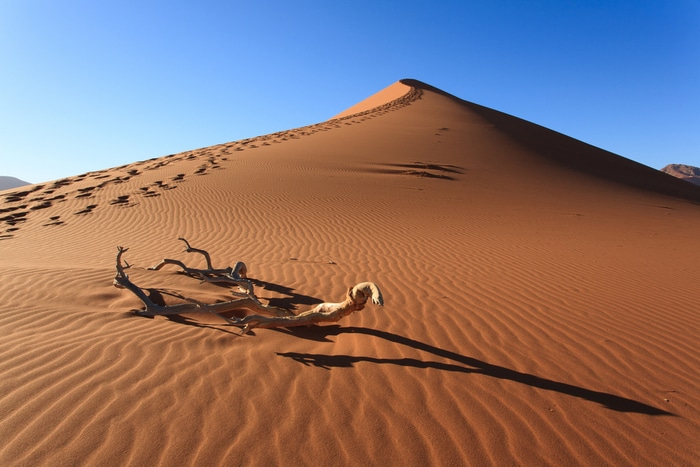

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


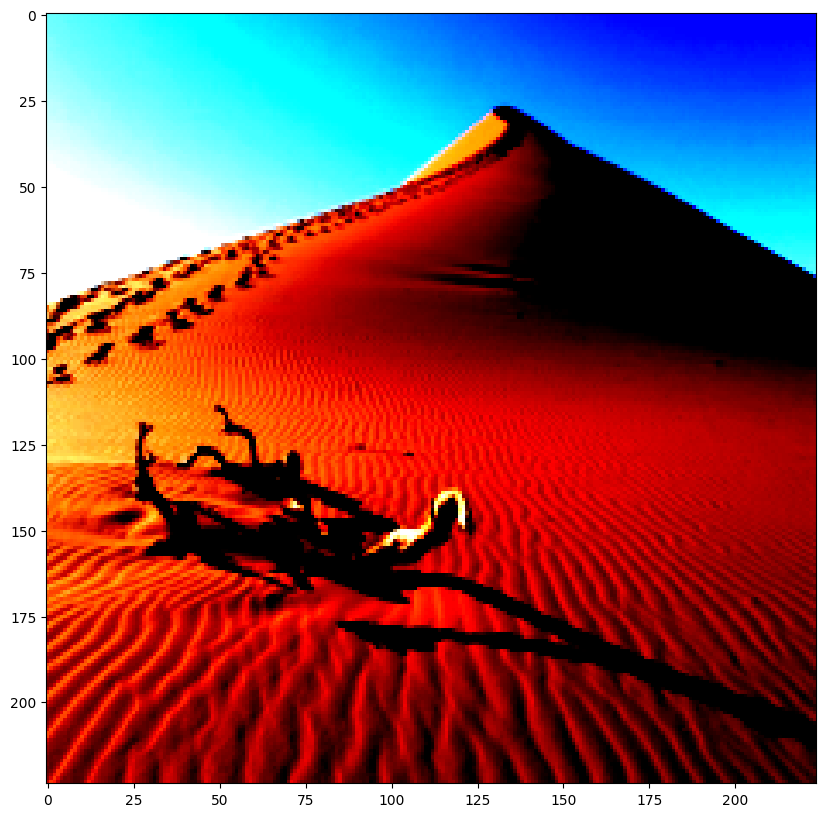


Prediction: 0.8708831667900085


In [13]:
import urllib
from PIL import Image
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

url = "https://media.cnn.com/api/v1/images/stellar/prod/220914082907-01-mosquito-fire-0913.jpg?c=16x9&q=h_720,w_1280,c_fill/f_webp"
url = "https://www.focusjunior.it/content/uploads/2018/12/deserto-kalahari.jpg"
filename = "test.jpg"

try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)

input_image = Image.open(filename)
display(input_image)

preprocessing = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(), 
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    
])

input_tensor = preprocessing(input_image)

# display the tensor as an image
plt.figure(figsize=(10,10))
plt.imshow(input_tensor.permute(1, 2, 0))
plt.show()

input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model
with torch.no_grad():
  model.eval()
  pred = output_activation(model(input_batch.to(device))).cpu().numpy().item()
print("\nPrediction:", pred)